# 1 Dataset

## 1.1 Récuperation du Dataset

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import os
import PIL

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.python.ops.numpy_ops import np_config
np_config.enable_numpy_behavior()
from keras.layers import Input, Dense, Conv2D, MaxPooling2D, UpSampling2D
from tensorflow.keras.models import Model

import zipfile
import os

In [3]:
!wget --no-check-certificate \
    "https://github.com/juliengriffoul/denoising-dataset/archive/refs/heads/main.zip" \
    -O "/tmp/dataset.zip"
zip_ref = zipfile.ZipFile('/tmp/dataset.zip', 'r')
zip_ref.extractall('/tmp')
zip_ref.close()

--2021-10-08 11:21:08--  https://github.com/juliengriffoul/denoising-dataset/archive/refs/heads/main.zip
Resolving github.com (github.com)... 140.82.112.3
Connecting to github.com (github.com)|140.82.112.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://codeload.github.com/juliengriffoul/denoising-dataset/zip/refs/heads/main [following]
--2021-10-08 11:21:08--  https://codeload.github.com/juliengriffoul/denoising-dataset/zip/refs/heads/main
Resolving codeload.github.com (codeload.github.com)... 140.82.113.10
Connecting to codeload.github.com (codeload.github.com)|140.82.113.10|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [application/zip]
Saving to: ‘/tmp/dataset.zip’

/tmp/dataset.zip        [    <=>             ]  18.00M  27.0MB/s    in 0.7s    

2021-10-08 11:21:09 (27.0 MB/s) - ‘/tmp/dataset.zip’ saved [18876224]



In [4]:
images_w = 400
images_h = 400
dataset_path = "/tmp/denoising-dataset-main/" #"C:/Users/tom-h/Documents/Option_1_Big_Data/projet/datasets/dataset_livrable_2"
batch_size = 32

In [5]:
train_ds = tf.keras.preprocessing.image_dataset_from_directory(
dataset_path,
labels="inferred",
label_mode='int',
validation_split=0.5,
subset="training",
seed=6,
image_size=(images_h, images_w),
batch_size=batch_size,
color_mode="rgb")

print(train_ds)
print(train_ds.class_names)
print(type(train_ds))

Found 150 files belonging to 1 classes.
Using 75 files for training.
<BatchDataset shapes: ((None, 400, 400, 3), (None,)), types: (tf.float32, tf.int32)>
['data']
<class 'tensorflow.python.data.ops.dataset_ops.BatchDataset'>


In [6]:
x_train, _ = iter(train_ds).next()
print(type(x_train))
x_train.shape

<class 'tensorflow.python.framework.ops.EagerTensor'>


TensorShape([32, 400, 400, 3])

In [7]:
test_ds = tf.keras.preprocessing.image_dataset_from_directory(
dataset_path,
labels="inferred",
label_mode='int',
validation_split= 0.5,
subset = "validation",
seed=6,
image_size=(images_h, images_w),
batch_size=batch_size)

print(test_ds)
print(test_ds.class_names)
print(type(test_ds))

Found 150 files belonging to 1 classes.
Using 75 files for validation.
<BatchDataset shapes: ((None, 400, 400, 3), (None,)), types: (tf.float32, tf.int32)>
['data']
<class 'tensorflow.python.data.ops.dataset_ops.BatchDataset'>


In [8]:
x_test, _ = iter(test_ds).next()
print(type(x_test))
x_test.shape

<class 'tensorflow.python.framework.ops.EagerTensor'>


TensorShape([32, 400, 400, 3])

In [9]:
# Data pre-processing 
x_train = x_train.astype('float32') / 255.
x_test = x_test.astype('float32') / 255.
x_train = np.reshape(x_train, (len(x_train), images_w, images_h, 3))
x_test = np.reshape(x_test, (len(x_test), images_w, images_h, 3))

In [10]:
import matplotlib.pyplot as plt

def display_image(X, n):
    plt.figure(figsize=(20, 20))
    for i in range(n):
        ax = plt.subplot(1, n, i+1)
        plt.imshow(X[i])
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)
    plt.show()

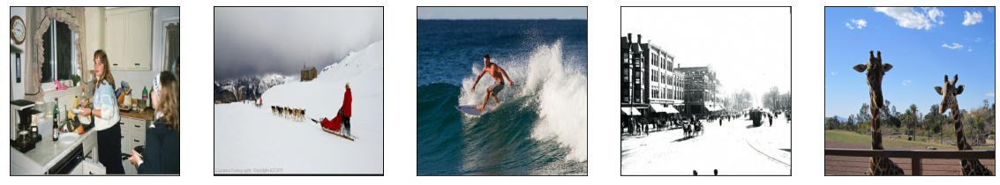

In [11]:
display_image(x_train, n=5)

## 1.2 Ajout de bruit

In [12]:
noise_factor = 0.4

In [13]:
x_train_noisy = x_train + noise_factor * np.random.normal(loc=0, scale=1, size=x_train.shape)
x_test_noisy = x_test + noise_factor * np.random.normal(loc=0, scale=1, size=x_train.shape)

x_train_noisy = np.clip(x_train_noisy, 0., 1.)
x_test_noisy = np.clip(x_test_noisy, 0., 1.)

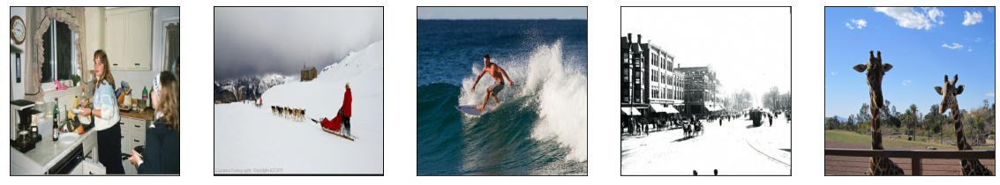

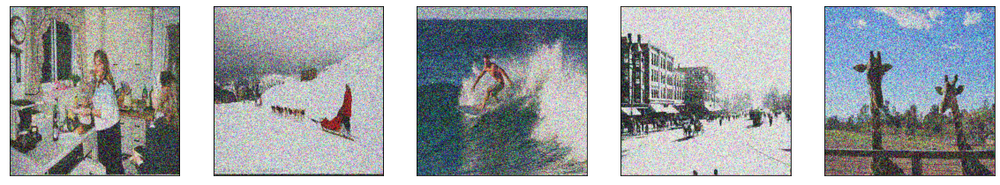

In [14]:
display_image(x_train, n=5)
display_image(x_train_noisy, n=5)

In [15]:
# Configurations principales de nos modèles
NB_EPOCHS_DENOISE = 100               # nombre epoch alogithme debruiter
SAV_MODEL_DENOISE = "denoiser.h5"     # sauvegarde du modele de debruitage

# 2 Auto-Encodeur

## 2.1 Model version 1 - Base Line

In [16]:
# The encoding process
input_img = Input(shape=(images_w, images_h, 3))

# Encoding #

# Conv1 #
x = Conv2D(filters=16, kernel_size=3, padding='same', activation='relu')(input_img)
# kernel_size: Specifying the height and width of the 2D convolution window.
x = MaxPooling2D(padding="same")(x)

# Conv 2 #
x = Conv2D(filters=32, kernel_size=3, padding='same', activation='relu')(x)
encoded = MaxPooling2D(padding="same")(x)

# Decoding #

# DeConv1
x = Conv2D(filters=32, kernel_size=3, padding='same', activation='relu')(encoded)
x = UpSampling2D()(x)

# DeConv2
x = Conv2D(filters=16, kernel_size=3, padding='same', activation='relu')(x)
x = UpSampling2D()(x)

# Deconv3
decoded = Conv2D(3, (3, 3),  padding="same", activation="sigmoid")(x)


### Sommaire

In [17]:
# Declare the model
autoencoder = Model(input_img, decoded)
autoencoder.compile(optimizer="adam", #"Adadelta" ne marche pas,
                    loss="binary_crossentropy") 
autoencoder.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 400, 400, 3)]     0         
_________________________________________________________________
conv2d (Conv2D)              (None, 400, 400, 16)      448       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 200, 200, 16)      0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 200, 200, 32)      4640      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 100, 100, 32)      0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 100, 100, 32)      9248      
_________________________________________________________________
up_sampling2d (UpSampling2D) (None, 200, 200, 32)      0     

In [18]:
%load_ext tensorboard

### Entrainement

In [19]:
## Train the model
history = autoencoder.fit(x_train_noisy, x_train,
                epochs=NB_EPOCHS_DENOISE,
                batch_size= batch_size,
                shuffle= False,
                validation_data=(x_test_noisy, x_test),
                callbacks=[tf.keras.callbacks.TensorBoard(log_dir='/tmp/tb', histogram_freq=0, write_graph=False)]
                )

Epoch 1/100
1/1 [==============================] - 34s 34s/step - loss: 0.6991 - val_loss: 0.6911
Epoch 2/100
1/1 [==============================] - 1s 904ms/step - loss: 0.6926 - val_loss: 0.6881
Epoch 3/100
1/1 [==============================] - 1s 624ms/step - loss: 0.6881 - val_loss: 0.6858
Epoch 4/100
1/1 [==============================] - 1s 633ms/step - loss: 0.6859 - val_loss: 0.6826
Epoch 5/100
1/1 [==============================] - 1s 629ms/step - loss: 0.6823 - val_loss: 0.6780
Epoch 6/100
1/1 [==============================] - 1s 615ms/step - loss: 0.6773 - val_loss: 0.6723
Epoch 7/100
1/1 [==============================] - 1s 749ms/step - loss: 0.6712 - val_loss: 0.6657
Epoch 8/100
1/1 [==============================] - 1s 744ms/step - loss: 0.6645 - val_loss: 0.6578
Epoch 9/100
1/1 [==============================] - 1s 633ms/step - loss: 0.6563 - val_loss: 0.6483
Epoch 10/100
1/1 [==============================] - 1s 617ms/step - loss: 0.6471 - val_loss: 0.6361
Epoch 11/1

### Résultat

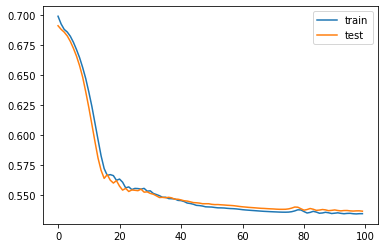

In [20]:
# Visualisation des pertes d'apprentissage (Train) et de validation (Test)
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='test')
plt.legend()

In [21]:
# save the model
autoencoder.save(filepath="autoencoder.h5")


Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 400, 400, 3)]     0         
_________________________________________________________________
conv2d (Conv2D)              (None, 400, 400, 16)      448       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 200, 200, 16)      0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 200, 200, 32)      4640      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 100, 100, 32)      0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 100, 100, 32)      9248      
_________________________________________________________________
up_sampling2d (UpSampling2D) (None, 200, 200, 32)      0     

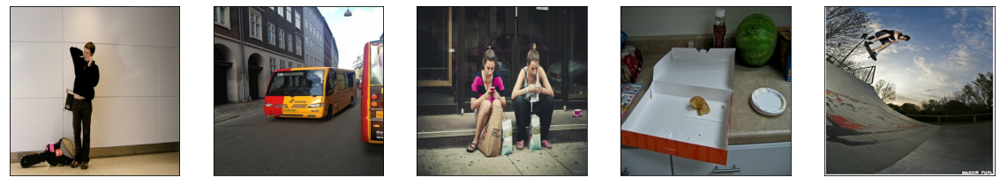

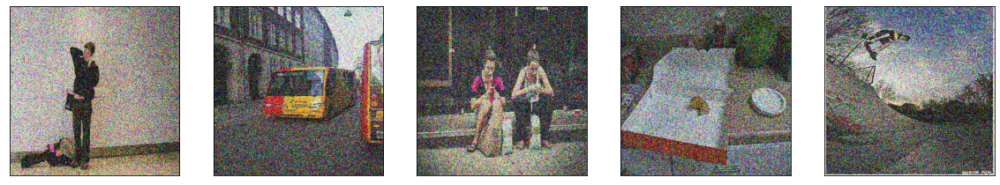

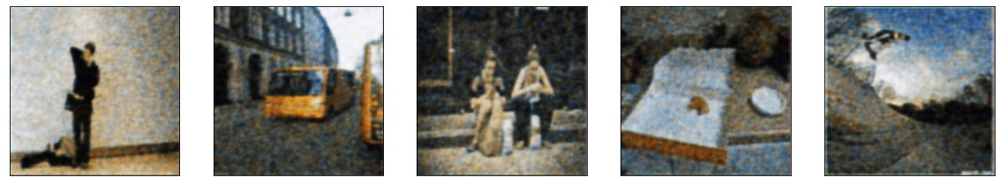

In [22]:
loaded_model = keras.models.load_model(filepath="autoencoder.h5")
loaded_model.summary()

display_image(x_test, n=5)
display_image(x_test_noisy, n=5)
predictions = loaded_model.predict(x_test_noisy)

predictions = np.reshape(predictions, (len(predictions), images_h, images_w, 3))

display_image(predictions, n=5)


## 2.2 Model version 2 - Ajout d'une couche

In [23]:
input_img = Input(shape=(images_w, images_h, 3))

# Encoding #

# Conv1 #
x = Conv2D(filters=16, kernel_size=3, padding='same', activation='relu')(input_img)
x = MaxPooling2D(padding="same")(x)

x = Conv2D(filters=16, kernel_size=3, padding='same', activation='relu')(x)
x = MaxPooling2D(padding="same")(x)

# Conv 2 #
x = Conv2D(filters=32, kernel_size=3, padding='same', activation='relu')(x)
encoded = MaxPooling2D(padding="same")(x)

#Decoding #


x = Conv2D(filters=32, kernel_size=3, padding='same', activation='relu')(encoded)
x = UpSampling2D()(x)

# DeConv2
x = Conv2D(filters=16, kernel_size=3, padding='same', activation='relu')(x)
x = UpSampling2D()(x)

x = Conv2D(filters=16, kernel_size=3, padding='same', activation='relu')(x)
x = UpSampling2D()(x)

# Deconv3
decoded = Conv2D(3, (3, 3),  padding="same", activation="sigmoid")(x)


### Sommaire

In [24]:

# Declare the model
autoencoder = Model(input_img, decoded)
autoencoder.compile(optimizer="adam", #"Adadelta" ne marche pas,
                    loss="binary_crossentropy") 
autoencoder.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 400, 400, 3)]     0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 400, 400, 16)      448       
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 200, 200, 16)      0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 200, 200, 16)      2320      
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 100, 100, 16)      0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 100, 100, 32)      4640      
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 50, 50, 32)        0   

In [25]:
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


### Entrainement

In [26]:
history = autoencoder.fit(x_train_noisy, x_train,
                epochs=NB_EPOCHS_DENOISE,
                batch_size= batch_size,
                shuffle= False,
                validation_data=(x_test_noisy, x_test),
                callbacks=[tf.keras.callbacks.TensorBoard(log_dir='/tmp/tb', histogram_freq=0, write_graph=False)]
                )

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 0.6946 - val_loss: 0.6901
Epoch 2/100
1/1 [==============================] - 1s 916ms/step - loss: 0.6915 - val_loss: 0.6875
Epoch 3/100
1/1 [==============================] - 1s 731ms/step - loss: 0.6905 - val_loss: 0.6850
Epoch 4/100
1/1 [==============================] - 1s 726ms/step - loss: 0.6865 - val_loss: 0.6830
Epoch 5/100
1/1 [==============================] - 1s 738ms/step - loss: 0.6840 - val_loss: 0.6771
Epoch 6/100
1/1 [==============================] - 1s 612ms/step - loss: 0.6790 - val_loss: 0.6696
Epoch 7/100
1/1 [==============================] - 1s 727ms/step - loss: 0.6731 - val_loss: 0.6610
Epoch 8/100
1/1 [==============================] - 1s 750ms/step - loss: 0.6649 - val_loss: 0.6502
Epoch 9/100
1/1 [==============================] - 1s 621ms/step - loss: 0.6539 - val_loss: 0.6371
Epoch 10/100
1/1 [==============================] - 1s 607ms/step - loss: 0.6413 - val_loss: 0.6204
Epoch 11/100

### Résultat

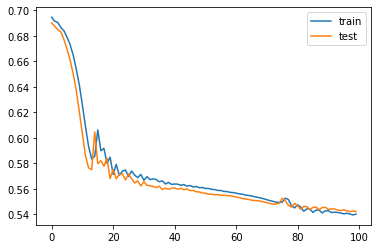

In [27]:
# Visualisation des pertes d'apprentissage (Train) et de validation (Test)
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='test')
plt.legend()

In [28]:
# save the model
autoencoder.save(filepath="autoencoder.h5")

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 400, 400, 3)]     0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 400, 400, 16)      448       
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 200, 200, 16)      0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 200, 200, 16)      2320      
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 100, 100, 16)      0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 100, 100, 32)      4640      
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 50, 50, 32)        0   

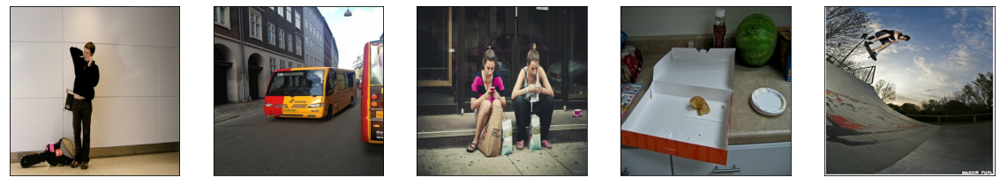

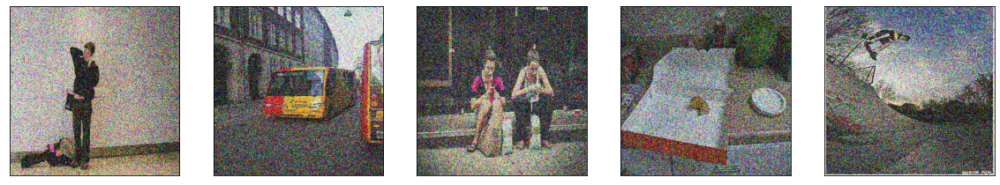

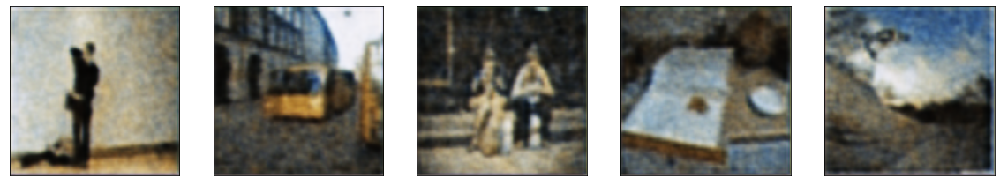

In [29]:
loaded_model = keras.models.load_model(filepath="autoencoder.h5")
loaded_model.summary()

display_image(x_test, n=5)
display_image(x_test_noisy, n=5)
predictions = loaded_model.predict(x_test_noisy)

predictions = np.reshape(predictions, (len(predictions), images_h, images_w, 3))

display_image(predictions, n=5)


## 2.3 Model version 3 - Augmentation de la dimention de la couche 2

In [30]:
input_img = Input(shape=(images_w, images_h, 3))

# Encoding #

# Conv1 #
x = Conv2D(filters=16, kernel_size=3, padding='same', activation='relu')(input_img)
x = MaxPooling2D(padding="same")(x)

# Conv 2 #
x = Conv2D(filters=64, kernel_size=3, padding='same', activation='relu')(x)
encoded = MaxPooling2D(padding="same")(x)

#Decoding #


x = Conv2D(filters=64, kernel_size=3, padding='same', activation='relu')(encoded)
x = UpSampling2D()(x)

x = Conv2D(filters=16, kernel_size=3, padding='same', activation='relu')(x)
x = UpSampling2D()(x)

# Deconv3
decoded = Conv2D(3, (3, 3),  padding="same", activation="sigmoid")(x)


### Sommaire

In [31]:
# Declare the model
autoencoder = Model(input_img, decoded)
autoencoder.compile(optimizer="adam", #"Adadelta" ne marche pas,
                    loss="binary_crossentropy") 
autoencoder.summary()

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         [(None, 400, 400, 3)]     0         
_________________________________________________________________
conv2d_12 (Conv2D)           (None, 400, 400, 16)      448       
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 200, 200, 16)      0         
_________________________________________________________________
conv2d_13 (Conv2D)           (None, 200, 200, 64)      9280      
_________________________________________________________________
max_pooling2d_6 (MaxPooling2 (None, 100, 100, 64)      0         
_________________________________________________________________
conv2d_14 (Conv2D)           (None, 100, 100, 64)      36928     
_________________________________________________________________
up_sampling2d_5 (UpSampling2 (None, 200, 200, 64)      0   

In [32]:
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


### Entrainement

In [33]:
history = autoencoder.fit(x_train_noisy, x_train,
                epochs=NB_EPOCHS_DENOISE,
                batch_size= batch_size,
                shuffle= False,
                validation_data=(x_test_noisy, x_test),
                callbacks=[tf.keras.callbacks.TensorBoard(log_dir='/tmp/tb', histogram_freq=0, write_graph=False)]
                )

Epoch 1/100
1/1 [==============================] - 4s 4s/step - loss: 0.7125 - val_loss: 0.6913
Epoch 2/100
1/1 [==============================] - 1s 1s/step - loss: 0.6920 - val_loss: 0.6909
Epoch 3/100
1/1 [==============================] - 1s 858ms/step - loss: 0.6911 - val_loss: 0.6880
Epoch 4/100
1/1 [==============================] - 1s 839ms/step - loss: 0.6891 - val_loss: 0.6855
Epoch 5/100
1/1 [==============================] - 1s 838ms/step - loss: 0.6867 - val_loss: 0.6822
Epoch 6/100
1/1 [==============================] - 1s 848ms/step - loss: 0.6836 - val_loss: 0.6774
Epoch 7/100
1/1 [==============================] - 1s 850ms/step - loss: 0.6793 - val_loss: 0.6710
Epoch 8/100
1/1 [==============================] - 1s 757ms/step - loss: 0.6741 - val_loss: 0.6647
Epoch 9/100
1/1 [==============================] - 1s 756ms/step - loss: 0.6676 - val_loss: 0.6564
Epoch 10/100
1/1 [==============================] - 1s 754ms/step - loss: 0.6593 - val_loss: 0.6440
Epoch 11/100
1/

### Résultat

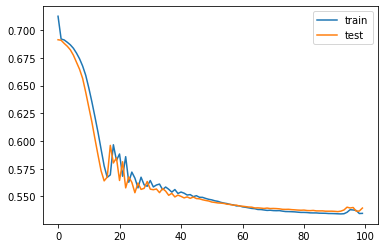

In [34]:
# Visualisation des pertes d'apprentissage (Train) et de validation (Test)
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='test')
plt.legend()

In [35]:
# save the model
autoencoder.save(filepath="autoencoder.h5")

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         [(None, 400, 400, 3)]     0         
_________________________________________________________________
conv2d_12 (Conv2D)           (None, 400, 400, 16)      448       
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 200, 200, 16)      0         
_________________________________________________________________
conv2d_13 (Conv2D)           (None, 200, 200, 64)      9280      
_________________________________________________________________
max_pooling2d_6 (MaxPooling2 (None, 100, 100, 64)      0         
_________________________________________________________________
conv2d_14 (Conv2D)           (None, 100, 100, 64)      36928     
_________________________________________________________________
up_sampling2d_5 (UpSampling2 (None, 200, 200, 64)      0   

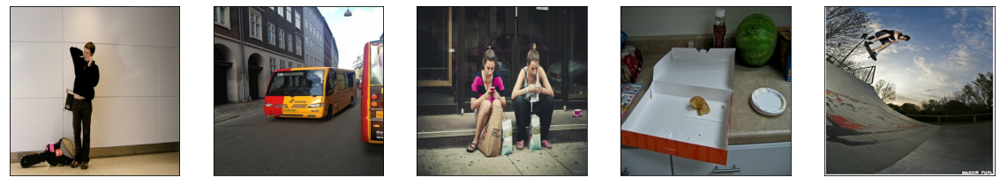

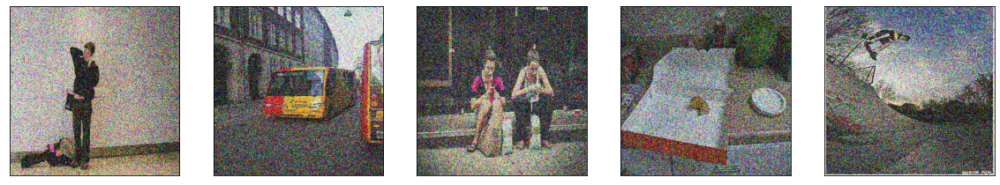

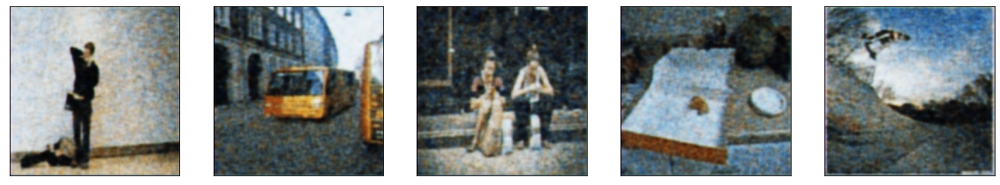

In [36]:
loaded_model = keras.models.load_model(filepath="autoencoder.h5")
loaded_model.summary()

display_image(x_test, n=5)
display_image(x_test_noisy, n=5)
predictions = loaded_model.predict(x_test_noisy)

predictions = np.reshape(predictions, (len(predictions), images_h, images_w, 3))

display_image(predictions, n=5)

## 2.4 Model version 4 - Augmentation du kernel

In [37]:
input_img = Input(shape=(images_w, images_h, 3))

# Encoding #

# Conv1 #
x = Conv2D(filters=16, kernel_size=6, padding='same', activation='relu')(input_img)
x = MaxPooling2D(padding="same")(x)

# Conv 2 #
x = Conv2D(filters=32, kernel_size=6, padding='same', activation='relu')(x)
encoded = MaxPooling2D(padding="same")(x)

#Decoding #


x = Conv2D(filters=32, kernel_size=6, padding='same', activation='relu')(encoded)
x = UpSampling2D()(x)

x = Conv2D(filters=16, kernel_size=6, padding='same', activation='relu')(x)
x = UpSampling2D()(x)

# Deconv3
decoded = Conv2D(3, (3, 3),  padding="same", activation="sigmoid")(x)


### Sommaire

In [38]:
# Declare the model
autoencoder = Model(input_img, decoded)
autoencoder.compile(optimizer="adam", #"Adadelta" ne marche pas,
                    loss="binary_crossentropy") 
autoencoder.summary()

Model: "model_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         [(None, 400, 400, 3)]     0         
_________________________________________________________________
conv2d_17 (Conv2D)           (None, 400, 400, 16)      1744      
_________________________________________________________________
max_pooling2d_7 (MaxPooling2 (None, 200, 200, 16)      0         
_________________________________________________________________
conv2d_18 (Conv2D)           (None, 200, 200, 32)      18464     
_________________________________________________________________
max_pooling2d_8 (MaxPooling2 (None, 100, 100, 32)      0         
_________________________________________________________________
conv2d_19 (Conv2D)           (None, 100, 100, 32)      36896     
_________________________________________________________________
up_sampling2d_7 (UpSampling2 (None, 200, 200, 32)      0   

In [39]:
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


### Entrainement

In [40]:
history = autoencoder.fit(x_train_noisy, x_train,
                epochs=NB_EPOCHS_DENOISE,
                batch_size= batch_size,
                shuffle= False,
                validation_data=(x_test_noisy, x_test),
                callbacks=[tf.keras.callbacks.TensorBoard(log_dir='/tmp/tb', histogram_freq=0, write_graph=False)]
                )

Epoch 1/100
1/1 [==============================] - 7s 7s/step - loss: 0.6929 - val_loss: 0.6887
Epoch 2/100
1/1 [==============================] - 1s 1s/step - loss: 0.6843 - val_loss: 0.6795
Epoch 3/100
1/1 [==============================] - 1s 830ms/step - loss: 0.6783 - val_loss: 0.6589
Epoch 4/100
1/1 [==============================] - 1s 894ms/step - loss: 0.6528 - val_loss: 0.6432
Epoch 5/100
1/1 [==============================] - 1s 828ms/step - loss: 0.6339 - val_loss: 0.6246
Epoch 6/100
1/1 [==============================] - 1s 831ms/step - loss: 0.6230 - val_loss: 0.5961
Epoch 7/100
1/1 [==============================] - 1s 895ms/step - loss: 0.5922 - val_loss: 0.6103
Epoch 8/100
1/1 [==============================] - 1s 895ms/step - loss: 0.6082 - val_loss: 0.6256
Epoch 9/100
1/1 [==============================] - 1s 894ms/step - loss: 0.6296 - val_loss: 0.5869
Epoch 10/100
1/1 [==============================] - 1s 826ms/step - loss: 0.5888 - val_loss: 0.6119
Epoch 11/100
1/

### Résultat

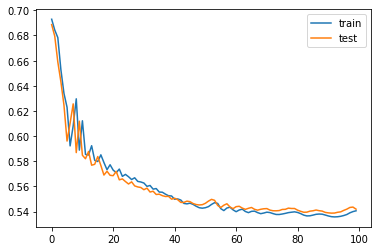

In [41]:
# Visualisation des pertes d'apprentissage (Train) et de validation (Test)
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='test')
plt.legend()

In [42]:
# save the model
autoencoder.save(filepath="autoencoder.h5")

Model: "model_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         [(None, 400, 400, 3)]     0         
_________________________________________________________________
conv2d_17 (Conv2D)           (None, 400, 400, 16)      1744      
_________________________________________________________________
max_pooling2d_7 (MaxPooling2 (None, 200, 200, 16)      0         
_________________________________________________________________
conv2d_18 (Conv2D)           (None, 200, 200, 32)      18464     
_________________________________________________________________
max_pooling2d_8 (MaxPooling2 (None, 100, 100, 32)      0         
_________________________________________________________________
conv2d_19 (Conv2D)           (None, 100, 100, 32)      36896     
_________________________________________________________________
up_sampling2d_7 (UpSampling2 (None, 200, 200, 32)      0   

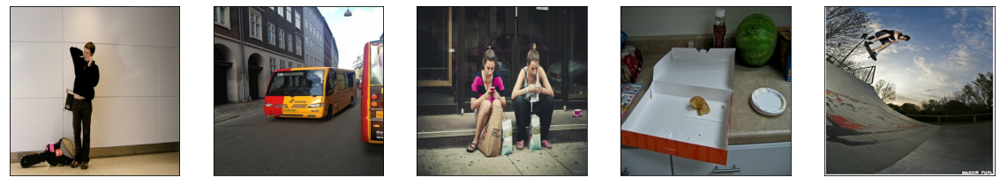

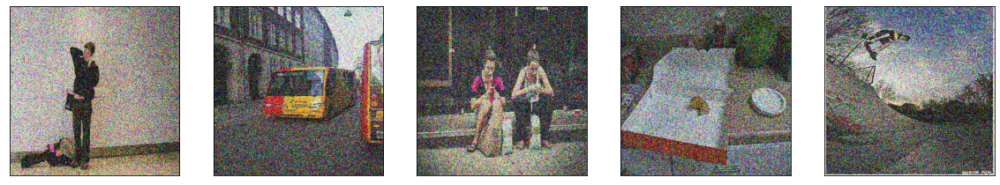

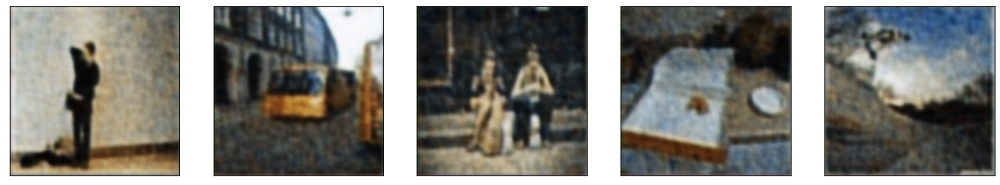

In [43]:
loaded_model = keras.models.load_model(filepath="autoencoder.h5")
loaded_model.summary()

display_image(x_test, n=5)
display_image(x_test_noisy, n=5)
predictions = loaded_model.predict(x_test_noisy)

predictions = np.reshape(predictions, (len(predictions), images_h, images_w, 3))

display_image(predictions, n=5)

## 2.5 Model version 5 - 

In [44]:
input_img = Input(shape=(images_w, images_h, 3))

# Encoding #

# Conv1 #
x = Conv2D(filters=16, kernel_size=3, padding='same', activation='sigmoid')(input_img)
x = MaxPooling2D(padding="same")(x)

# Conv 2 #
x = Conv2D(filters=32, kernel_size=3, padding='same', activation='sigmoid')(x)
encoded = MaxPooling2D(padding="same")(x)

#Decoding #


x = Conv2D(filters=32, kernel_size=3, padding='same', activation='sigmoid')(encoded)
x = UpSampling2D()(x)

x = Conv2D(filters=16, kernel_size=3, padding='same', activation='sigmoid')(x)
x = UpSampling2D()(x)

# Deconv3
decoded = Conv2D(3, (3, 3),  padding="same", activation="sigmoid")(x)


In [45]:
# Declare the model
autoencoder = Model(input_img, decoded)
autoencoder.compile(optimizer="adam", #"Adadelta" ne marche pas,
                    loss="binary_crossentropy") 
autoencoder.summary()

Model: "model_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_5 (InputLayer)         [(None, 400, 400, 3)]     0         
_________________________________________________________________
conv2d_22 (Conv2D)           (None, 400, 400, 16)      448       
_________________________________________________________________
max_pooling2d_9 (MaxPooling2 (None, 200, 200, 16)      0         
_________________________________________________________________
conv2d_23 (Conv2D)           (None, 200, 200, 32)      4640      
_________________________________________________________________
max_pooling2d_10 (MaxPooling (None, 100, 100, 32)      0         
_________________________________________________________________
conv2d_24 (Conv2D)           (None, 100, 100, 32)      9248      
_________________________________________________________________
up_sampling2d_9 (UpSampling2 (None, 200, 200, 32)      0   

In [46]:
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [47]:
history = autoencoder.fit(x_train_noisy, x_train,
                epochs=NB_EPOCHS_DENOISE,
                batch_size= batch_size,
                shuffle= False,
                validation_data=(x_test_noisy, x_test),
                callbacks=[tf.keras.callbacks.TensorBoard(log_dir='/tmp/tb', histogram_freq=0, write_graph=False)]
                )

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 0.7038 - val_loss: 0.6944
Epoch 2/100
1/1 [==============================] - 1s 1s/step - loss: 0.6944 - val_loss: 0.6887
Epoch 3/100
1/1 [==============================] - 1s 770ms/step - loss: 0.6941 - val_loss: 0.6880
Epoch 4/100
1/1 [==============================] - 1s 755ms/step - loss: 0.6961 - val_loss: 0.6881
Epoch 5/100
1/1 [==============================] - 1s 768ms/step - loss: 0.6966 - val_loss: 0.6884
Epoch 6/100
1/1 [==============================] - 1s 656ms/step - loss: 0.6957 - val_loss: 0.6892
Epoch 7/100
1/1 [==============================] - 1s 648ms/step - loss: 0.6945 - val_loss: 0.6906
Epoch 8/100
1/1 [==============================] - 1s 662ms/step - loss: 0.6936 - val_loss: 0.6922
Epoch 9/100
1/1 [==============================] - 1s 660ms/step - loss: 0.6933 - val_loss: 0.6936
Epoch 10/100
1/1 [==============================] - 1s 760ms/step - loss: 0.6935 - val_loss: 0.6943
Epoch 11/100
1/

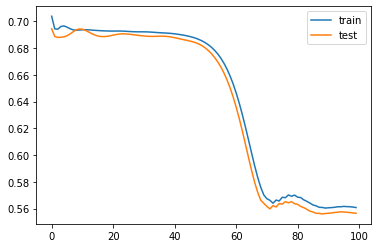

In [48]:
# Visualisation des pertes d'apprentissage (Train) et de validation (Test)
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='test')
plt.legend()

In [49]:
# save the model
autoencoder.save(filepath="autoencoder.h5")

Model: "model_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_5 (InputLayer)         [(None, 400, 400, 3)]     0         
_________________________________________________________________
conv2d_22 (Conv2D)           (None, 400, 400, 16)      448       
_________________________________________________________________
max_pooling2d_9 (MaxPooling2 (None, 200, 200, 16)      0         
_________________________________________________________________
conv2d_23 (Conv2D)           (None, 200, 200, 32)      4640      
_________________________________________________________________
max_pooling2d_10 (MaxPooling (None, 100, 100, 32)      0         
_________________________________________________________________
conv2d_24 (Conv2D)           (None, 100, 100, 32)      9248      
_________________________________________________________________
up_sampling2d_9 (UpSampling2 (None, 200, 200, 32)      0   

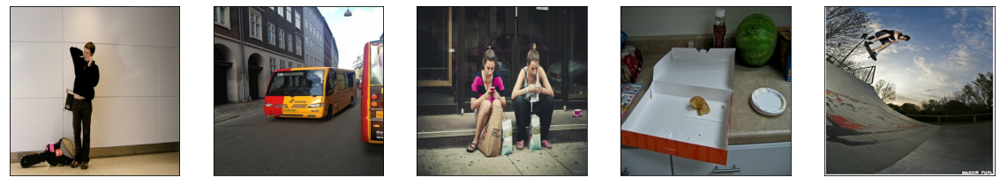

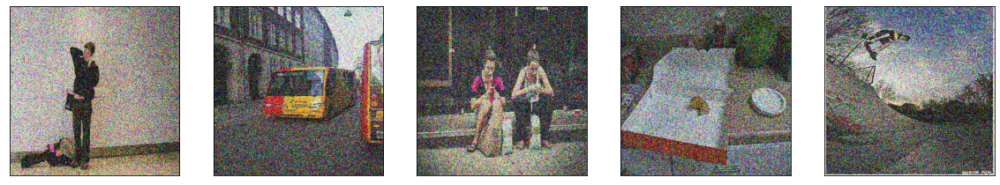

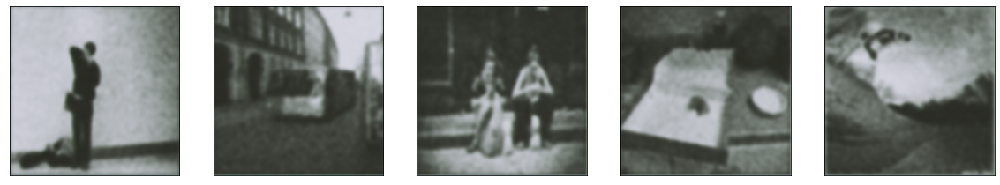

In [50]:
loaded_model = keras.models.load_model(filepath="autoencoder.h5")
loaded_model.summary()

display_image(x_test, n=5)
display_image(x_test_noisy, n=5)
predictions = loaded_model.predict(x_test_noisy)

predictions = np.reshape(predictions, (len(predictions), images_h, images_w, 3))

display_image(predictions, n=5)

## 2.6 Model version 6 - 

Model: "model_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_6 (InputLayer)         [(None, 400, 400, 3)]     0         
_________________________________________________________________
conv2d_27 (Conv2D)           (None, 400, 400, 16)      448       
_________________________________________________________________
max_pooling2d_11 (MaxPooling (None, 200, 200, 16)      0         
_________________________________________________________________
conv2d_28 (Conv2D)           (None, 200, 200, 32)      4640      
_________________________________________________________________
max_pooling2d_12 (MaxPooling (None, 100, 100, 32)      0         
_________________________________________________________________
conv2d_29 (Conv2D)           (None, 100, 100, 32)      9248      
_________________________________________________________________
up_sampling2d_11 (UpSampling (None, 200, 200, 32)      0   

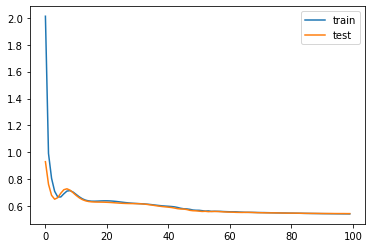

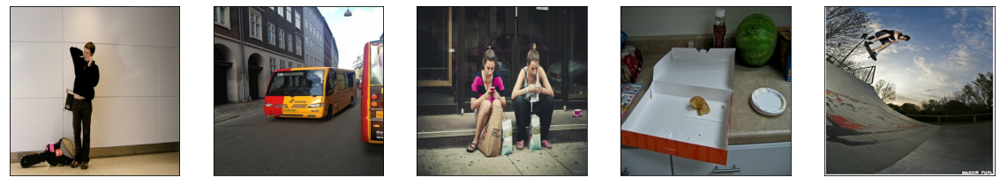

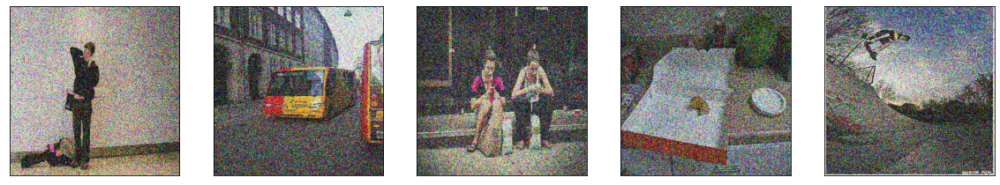

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


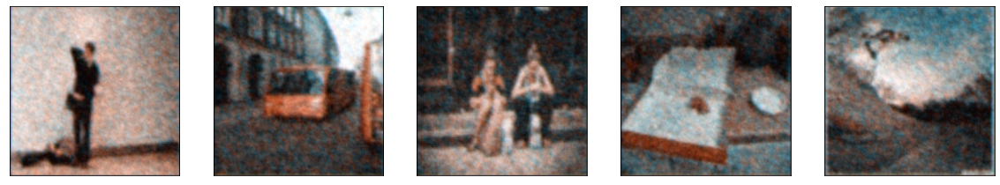

In [51]:
input_img = Input(shape=(images_w, images_h, 3))

# Encoding #
x = Conv2D(filters=16, kernel_size=3, padding='same', activation='relu')(input_img)
x = MaxPooling2D(padding="same")(x)

x = Conv2D(filters=32, kernel_size=3, padding='same', activation='relu')(x)
encoded = MaxPooling2D(padding="same")(x)

#Decoding #
x = Conv2D(filters=32, kernel_size=3, padding='same', activation='relu')(encoded)
x = UpSampling2D()(x)

x = Conv2D(filters=16, kernel_size=3, padding='same', activation='relu')(x)
x = UpSampling2D()(x)

# Deconv3
decoded = Conv2D(3, (3, 3),  padding="same", activation="relu")(x)




# Declare the model
autoencoder = Model(input_img, decoded)
autoencoder.compile(optimizer="adam", #"Adadelta" ne marche pas,
                    loss="binary_crossentropy") 
autoencoder.summary()

%load_ext tensorboard


#Entrainement
history = autoencoder.fit(x_train_noisy, x_train,
                epochs=NB_EPOCHS_DENOISE,
                batch_size= batch_size,
                shuffle= False,
                validation_data=(x_test_noisy, x_test),
                callbacks=[tf.keras.callbacks.TensorBoard(log_dir='/tmp/tb', histogram_freq=0, write_graph=False)]
                )


# Visualisation des pertes d'apprentissage (Train) et de validation (Test)
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='test')
plt.legend()


# save the model
autoencoder.save(filepath="autoencoder.h5")

loaded_model = keras.models.load_model(filepath="autoencoder.h5")
loaded_model.summary()

display_image(x_test, n=5)
display_image(x_test_noisy, n=5)
predictions = loaded_model.predict(x_test_noisy)

predictions = np.reshape(predictions, (len(predictions), images_h, images_w, 3))

display_image(predictions, n=5)

## 2.7 Model version 7 -


Model: "model_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_7 (InputLayer)         [(None, 400, 400, 3)]     0         
_________________________________________________________________
conv2d_32 (Conv2D)           (None, 400, 400, 32)      896       
_________________________________________________________________
max_pooling2d_13 (MaxPooling (None, 200, 200, 32)      0         
_________________________________________________________________
conv2d_33 (Conv2D)           (None, 200, 200, 32)      9248      
_________________________________________________________________
max_pooling2d_14 (MaxPooling (None, 100, 100, 32)      0         
_________________________________________________________________
conv2d_34 (Conv2D)           (None, 100, 100, 32)      9248      
_________________________________________________________________
up_sampling2d_13 (UpSampling (None, 200, 200, 32)      0   

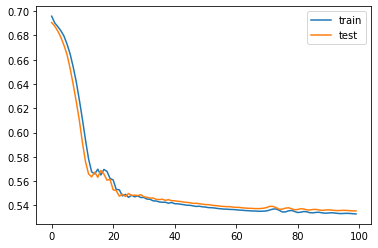

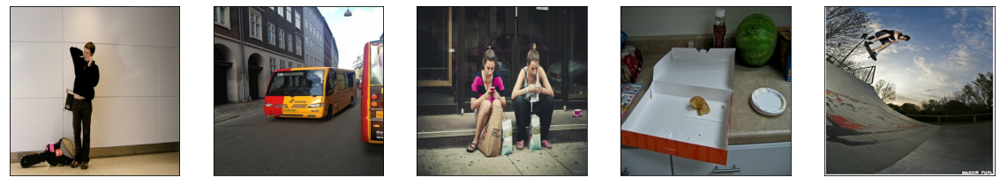

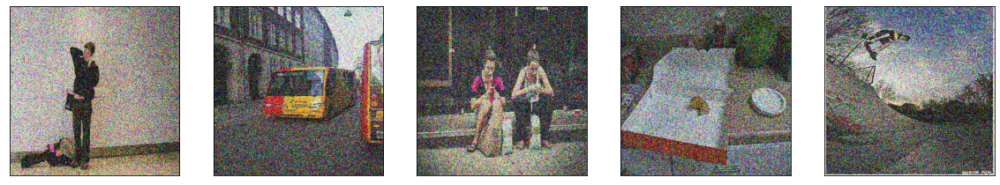

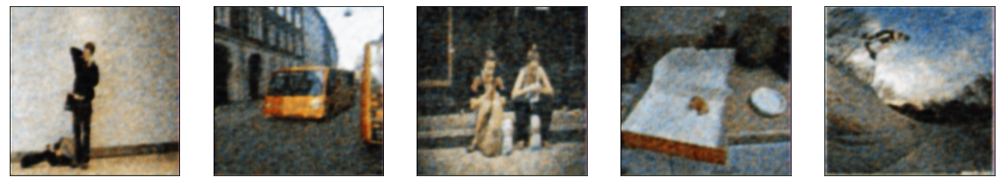

In [52]:
input_img = Input(shape=(images_w, images_h, 3))

# Encoding #
x = Conv2D(filters=32, kernel_size=3, padding='same', activation='relu')(input_img)
x = MaxPooling2D(padding="same")(x)

x = Conv2D(filters=32, kernel_size=3, padding='same', activation='relu')(x)
encoded = MaxPooling2D(padding="same")(x)

#Decoding #
x = Conv2D(filters=32, kernel_size=3, padding='same', activation='relu')(encoded)
x = UpSampling2D()(x)

x = Conv2D(filters=32, kernel_size=3, padding='same', activation='relu')(x)
x = UpSampling2D()(x)

# Deconv3
decoded = Conv2D(3, (3, 3),  padding="same", activation="sigmoid")(x)




# Declare the model
autoencoder = Model(input_img, decoded)
autoencoder.compile(optimizer="adam", #"Adadelta" ne marche pas,
                    loss="binary_crossentropy") 
autoencoder.summary()

%load_ext tensorboard


#Entrainement
history = autoencoder.fit(x_train_noisy, x_train,
                epochs=NB_EPOCHS_DENOISE,
                batch_size= batch_size,
                shuffle= False,
                validation_data=(x_test_noisy, x_test),
                callbacks=[tf.keras.callbacks.TensorBoard(log_dir='/tmp/tb', histogram_freq=0, write_graph=False)]
                )


# Visualisation des pertes d'apprentissage (Train) et de validation (Test)
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='test')
plt.legend()


# save the model
autoencoder.save(filepath="autoencoder.h5")

loaded_model = keras.models.load_model(filepath="autoencoder.h5")
loaded_model.summary()

display_image(x_test, n=5)
display_image(x_test_noisy, n=5)
predictions = loaded_model.predict(x_test_noisy)

predictions = np.reshape(predictions, (len(predictions), images_h, images_w, 3))

display_image(predictions, n=5)

## 2.8 Model version 8 -


Model: "model_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_8 (InputLayer)         [(None, 400, 400, 3)]     0         
_________________________________________________________________
conv2d_37 (Conv2D)           (None, 400, 400, 16)      448       
_________________________________________________________________
max_pooling2d_15 (MaxPooling (None, 200, 200, 16)      0         
_________________________________________________________________
conv2d_38 (Conv2D)           (None, 200, 200, 16)      2320      
_________________________________________________________________
max_pooling2d_16 (MaxPooling (None, 100, 100, 16)      0         
_________________________________________________________________
conv2d_39 (Conv2D)           (None, 100, 100, 16)      2320      
_________________________________________________________________
up_sampling2d_15 (UpSampling (None, 200, 200, 16)      0   

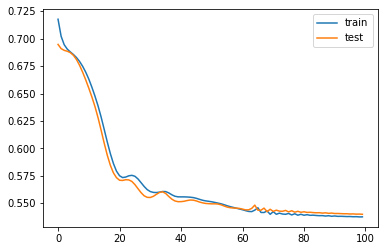

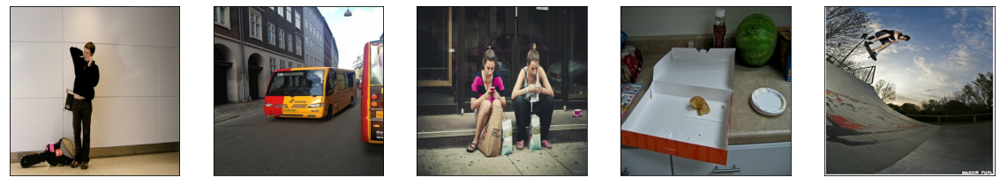

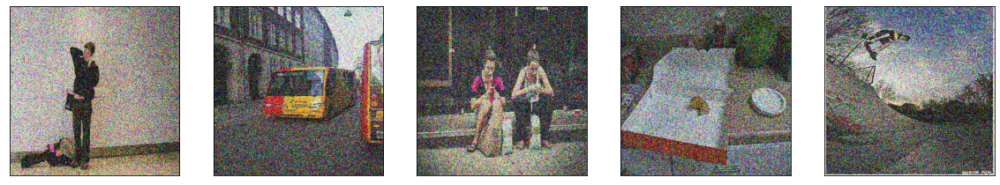

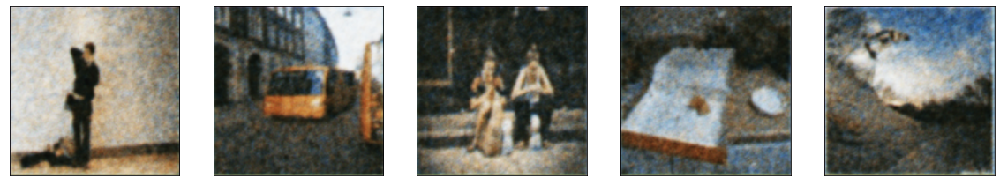

In [53]:
input_img = Input(shape=(images_w, images_h, 3))

# Encoding #
x = Conv2D(filters=16, kernel_size=3, padding='same', activation='relu')(input_img)
x = MaxPooling2D(padding="same")(x)

x = Conv2D(filters=16, kernel_size=3, padding='same', activation='relu')(x)
encoded = MaxPooling2D(padding="same")(x)

#Decoding #
x = Conv2D(filters=16, kernel_size=3, padding='same', activation='relu')(encoded)
x = UpSampling2D()(x)

x = Conv2D(filters=16, kernel_size=3, padding='same', activation='relu')(x)
x = UpSampling2D()(x)

# Deconv3
decoded = Conv2D(3, (3, 3),  padding="same", activation="sigmoid")(x)




# Declare the model
autoencoder = Model(input_img, decoded)
autoencoder.compile(optimizer="adam", #"Adadelta" ne marche pas,
                    loss="binary_crossentropy") 
autoencoder.summary()

%load_ext tensorboard


#Entrainement
history = autoencoder.fit(x_train_noisy, x_train,
                epochs=NB_EPOCHS_DENOISE,
                batch_size= batch_size,
                shuffle= False,
                validation_data=(x_test_noisy, x_test),
                callbacks=[tf.keras.callbacks.TensorBoard(log_dir='/tmp/tb', histogram_freq=0, write_graph=False)]
                )


# Visualisation des pertes d'apprentissage (Train) et de validation (Test)
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='test')
plt.legend()


# save the model
autoencoder.save(filepath="autoencoder.h5")

loaded_model = keras.models.load_model(filepath="autoencoder.h5")
loaded_model.summary()

display_image(x_test, n=5)
display_image(x_test_noisy, n=5)
predictions = loaded_model.predict(x_test_noisy)

predictions = np.reshape(predictions, (len(predictions), images_h, images_w, 3))

display_image(predictions, n=5)